In [1]:
# Importing all needed Packages
import os # needed for working through filepaths and directorys
import csv # For reading the CSV file.
import itertools # various packages for iteration
from itertools import islice # for subselecting rows in a csv file
from collections import Iterable # needed for testing if an item is iterable
import pandas as pd # import for working with data frames
from pandas import Series # for working with series
from matplotlib import pyplot # for plotting
import matplotlib # for plotting
import matplotlib.patches as mpatches # for making a good legend
import statsmodels.api as sm # for doing stats
import matplotlib.pylab as plt # more plotting 
from statsmodels.graphics.tsaplots import plot_acf # for autocorrelation plot
from pandas.plotting import andrews_curves, autocorrelation_plot # to plot multiple time series together
import numpy as np # to do various numeric manipulations with arrays
import scipy as sp # to do various scientific data manipulations
import tslearn # for learning time series classification
import tsfresh # for automated feature extraction and selection
from tsfresh import extract_features, select_features # functions to compute and select features
from sklearn.preprocessing import LabelEncoder # tslearn does not work directly with categorical data
from xgboost import XGBClassifier # used to rank feature importance and train data.
from xgboost import plot_importance # to plot feature importance
from matplotlib import pyplot # for making plots
from sklearn.metrics import accuracy_score # to assess accuracy
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier # a model to include in a stack
from sklearn.svm import SVC # classification model to include in stack
from sklearn.neighbors import KNeighborsClassifier # model to include in stack
from sklearn.model_selection import train_test_split # for test train splits
from sklearn.neural_network import MLPClassifier # for adding a neural network to the ensemble 
from vecstack import stacking # the ability to stack models
from sklearn.ensemble import VotingClassifier # to ensemble and fine tune models
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV # to grid search and tune models
import warnings # need to turn off deprication warnings that can be ignored from a single function
import random # for 

C:\Users\lemkp0\AppData\Local\Continuum\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools
C:\Users\lemkp0\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
# a helper function to generate the absolute filepaths for every file in the directory
def absoluteFilePaths(directory): # the function contains only one 
    for dirpath,_,filenames in os.walk(directory): # getting all files and absolute paths in directory
        for f in filenames: # iterate through all filenames
            yield os.path.abspath(os.path.join(dirpath, f)) # generate a concatenation of the file and its path

In [3]:
# Create Function for Reading in the files
def getcsvdata(tablename, filepath):
    table = {} # create an empty dictionary to fill with data.
    tasktype = tablename.split("_")[0] # extract the activity/task type from the tablename based on the directory structure 
    # The following opens the file, and uses the data to create a dictionary of keys and values.
    with open(filepath, 'r', newline='') as f1: #Define the file name and an alias.
        reader = csv.reader(f1, skipinitialspace=True)  # define the reader
        for row in islice(reader, 3, None): # Skip first 4 rows in file by working in a slice after those rows.
            header = next(reader) # Isolate the next row as the header.
            for name in header: # For loop to iterate through the header row.
                table[name] = [] # Create empty keys using the header column names.
            for row in reader: # Iterate through each row in the reader.
                for i, value in enumerate(row): # iterate through the rows with an added counter
                    if value != "":
                        value.strip() # remove whitespace at either end
                        #print(row) # only used for debugging row level iteration issues, otherwise commented out.
                        table[header[i]].append(float(value)) # stick values in rows. 
            table = pd.DataFrame(table).rename(columns={'# Columns: time': 'Time', #convert to dataframe and rename columns
                                                        'avg_rss12': 'chest_rightleg_avg', 
                                                        'avg_rss13': 'chest_leftleg_avg', 
                                                        'avg_rss23': 'legs_avg',
                                                        'var_rss12': 'chest_rightleg_var', 
                                                        'var_rss13': 'chest_leftleg_var', 
                                                        'var_rss23': 'legs_var'}) 
            table['Activity'] = tasktype # assign an extra column with the activity type
        f1.close() # Close the file
    return (tablename, table) # return the table and tablename as a tuple

In [4]:
# a helper function to take the csv files from the list and generate a (tablename, filepath) dictionary.
def maketablepaths(directory):
    lst = list(absoluteFilePaths(directory)) # create list from generator function
    lst = [k for k in lst if '.csv' in k] # list comprehension to only take the .csv files
    tblname = [(x.split(directory + '\\',1)[1]).replace("\\", "_") for x in lst] # split out a tablename based on the subfolder(s) and csv filename
    return list(zip(tblname, lst)) # return tuples list of paths and filenames

In [5]:
# fuction to iterate through all files in a given directory and return a tuple of tables with table names
def maketablesfromdirectory(directory):
    alltables = {} # create an empty dictionary to fill
    totalfiles = maketablepaths(directory) # get all filepaths and names for tables
    j = 0 # Set counter to 0 
    while j < len(totalfiles): # Using while loop to iterate through the full set of csv files 
        if totalfiles[j] == 0: # testing to see if it's done
            totalfiles.pop(j) # remove and return last item
        else:
            newtable = getcsvdata(totalfiles[j][0], totalfiles[j][1]) # apply funtion to total files tupple 
            alltables[newtable[0]] = newtable[1] # Append table name and table
            # print(j, newtable[0]) # print progess, used for debugging which table caused a problem otherwise commented out
            j += 1 # advance iterator by 1
    return alltables # return the dictionary of dictionaries 

In [6]:
# a function to create a list of dictionary keys based on the activity type substring
def subset_of_dictionary_keys(substring, dictionary_added): # function takes a substring and an actual dictionary
    dictionary_keys = list(dictionary_added.keys()) # make a list of the dictionary's keys
    keys_subset = [key for key in dictionary_keys if substring in key] # make the subset
    return keys_subset

In [7]:
# a function to subset a dictionary based on a list of keys
def subsetdictionary(keys_list, dict_add):
    d1 = {} # create an empty dictionary
    for key in keys_list:
        d1.update({key:''}) # add keys to empty dictionary
    d2 = { key:value for key,value in dict_add.items() if key in keys_list } # dictionary list comprehension to subset dictionary
    return d2

In [8]:
# a function to get a list of all columns in a dataframe except a given column
def get_column_names(columns_to_exclude, my_dataframe): # function takes a column list to exclude from the list and a dataframe
    columns_list = list(my_dataframe.columns.values) # create a list of all columns in the dataframe
    return [item for item in columns_list if item not in columns_to_exclude] # filter out the column to be excluded

In [9]:
# a function to split a data frame of N columns into N-1 dataframes of 2 columns each and place them in a dictionary
def splitdataframe(common_column, column_to_exclude, dataframe): #function takes a common column to be used for joining, one to exclude, and a dataframe
    Dictionary_of_Columns = {} # create an empty dictionary to be filled in
    column_list = get_column_names([common_column, column_to_exclude], dataframe) # make a list of columns to be made into separate dataframes
    for column in column_list: # iterate through columns
        Dictionary_of_Columns[column] = dataframe[[common_column, column]] # create dictionary of dataframes
    return Dictionary_of_Columns # return dictionary

In [10]:
# a function to create a dictionary of dictionaries of column names. This is useful for retrieving columns at a later time.
def make_column_dictionary(common_column_for_later_merging, column_to_exclude, dictionary_of_dataframes): # function takes a dictionary of dataframes and a common column among all of them
    DataFrame_names = list(dictionary_of_dataframes.keys()) # get a list of dictionary keys
    allcolumns_dataframe = {} # make an empty dictionary for populating
    for dataframe in DataFrame_names: # iterate through dataframes
        # below applies a prior function to split apart the dataframes
        allcolumns_dataframe[dataframe] = splitdataframe(common_column_for_later_merging, column_to_exclude, dictionary_of_dataframes[dataframe])
    return allcolumns_dataframe

In [11]:
# executing some functions and naming variables that will be usefull later. 
directory_path = 'the_absolute_path_of_your_directory_here' # define the directory path
All_tables = maketablesfromdirectory(directory_path) # run the chain of helper functions to get all tables
tables_keys = list(All_tables.keys()) #create an indexed list for accessing dictionary keys
Activity_types = list(set([x.split('_', 1)[0] for x in tables_keys])) # create a list of the unique activity types
ColumnRetrievalDictionary = make_column_dictionary('Time','Activity', maketablesfromdirectory(directory_path)) # Create a dictionary to retrieve any column by activity type and filename

In [12]:
# A function to take a list of columns, an activity list, and a dictionary of dataframe columns and combine them into a single datarame
def make_frame_of_common_columns(column_list, join_column, activity_list, dictionary_of_columns):
    dictionary_keys = [] # an empty list to append items to
    for activity in activity_list: # iterate through activity list
        dictionary_keys.append(subset_of_dictionary_keys(activity, dictionary_of_columns)) # append key subset to list
        # now flatten the list if needed without splitting base strings
    flat_dictionary_keys = []
    for key in dictionary_keys: 
        if isinstance(key, Iterable) and not isinstance(key, (str, bytes)): # check if it is a basestring or an iterable
            for subc in key: # if it is iterable flatten it
                flat_dictionary_keys.append(subc) # append the item
        else:
            flat_dictionary_keys.append(key) # append the basestring if it wasn't iterable
    dictionary_keys = flat_dictionary_keys # rename rseult for remaining use
    # next it is neccesary to subset the dictionary based on the dictionary_keys
    new_dictionary = subsetdictionary(dictionary_keys, dictionary_of_columns) # create the subsetted dictionary based on the keys
    j = 0 # set counter to zero
    df1 = new_dictionary[dictionary_keys[0]][column_list[0]][[join_column]] # create initial dataframe as the join column
    while j < len(dictionary_keys):
        iterdict = new_dictionary[dictionary_keys[j]] # select a dictionary item based on the iteration
        dataname = dictionary_keys[j] # temporarily assign a variable to be used for naming columns
        j += 1 # increase counter
        i = 0 # set sub iterator to zero
        while i < len(column_list):
            df1 = df1.merge(iterdict[column_list[i]], on = join_column) # join a column
            df1 = df1.rename(index=str, columns={column_list[i]: dataname + "--" + column_list[i]}) # rename the new column to identify it based on its data source
            i += 1 # progress counter
    return df1

In [13]:
# a function to generate plots and simple plots for a given table
def plotacfs(x):
    tble = All_tables[tables_keys[x]] # select table based on given index
    columns_list = tble.columns.values # create a list of column names to be used for naming plots
    #extract table columns to series. 
    series1 = Series(tble.iloc[:,[1]].T.squeeze())
    series2 = Series(tble.iloc[:,[2]].T.squeeze())
    series3 = Series(tble.iloc[:,[3]].T.squeeze())
    series4 = Series(tble.iloc[:,[4]].T.squeeze())
    series5 = Series(tble.iloc[:,[5]].T.squeeze())
    series6 = Series(tble.iloc[:,[6]].T.squeeze())

    fig, axes = plt.subplots(2,6) # generate grid axes to fill with plots and set the axis limits for all of these.
    axes[0][0].set_xlim([0, 480]); axes[0][0].set_ylim([-1, 1])
    axes[0][1].set_xlim([0, 480]); axes[0][1].set_ylim([-1, 1])
    axes[0][2].set_xlim([0, 480]); axes[0][2].set_ylim([-1, 1])
    axes[0][3].set_xlim([0, 480]); axes[0][3].set_ylim([-1, 1])
    axes[0][4].set_xlim([0, 480]); axes[0][4].set_ylim([-1, 1])
    axes[0][5].set_xlim([0, 480]); axes[0][5].set_ylim([-1, 1])
    axes[1][0].set_xlim([0, 480]); axes[1][0].set_ylim([0, 50])
    axes[1][1].set_xlim([0, 480]); axes[1][1].set_ylim([0, 50])
    axes[1][2].set_xlim([0, 480]); axes[1][2].set_ylim([0, 50])
    axes[1][3].set_xlim([0, 480]); axes[1][3].set_ylim([0, 6])
    axes[1][4].set_xlim([0, 480]); axes[1][4].set_ylim([0, 6])
    axes[1][5].set_xlim([0, 480]); axes[1][5].set_ylim([0, 6])
    
    fig = plot_acf(series1, ax=axes[0][0], title=columns_list[1] + "\n plot_acf", ) # create ACF plot in correct axis slot
    fig = series1.plot(ax=axes[1][0], title=columns_list[1] + '\n raw')             # create simple line plot below its ACF plot
    fig = plot_acf(series2, ax=axes[0][1], title=columns_list[2] + "\n plot_acf", )
    fig = series2.plot(ax=axes[1][1], title=columns_list[2] + '\n raw')
    fig = plot_acf(series3, ax=axes[0][2], title=columns_list[3] + "\n plot_acf", )
    fig = series3.plot(ax=axes[1][2], title=columns_list[3] + '\n raw')
    fig = plot_acf(series4, ax=axes[0][3], title=columns_list[4] + "\n plot_acf", )
    fig = series4.plot(ax=axes[1][3], title=columns_list[4] + '\n raw')
    fig = plot_acf(series5, ax=axes[0][4], title=columns_list[5] + "\n plot_acf", )
    fig = series5.plot(ax=axes[1][4], title=columns_list[5] + '\n raw')
    fig = plot_acf(series6, ax=axes[0][5], title=columns_list[6] + "\n plot_acf", )
    fig = series6.plot(ax=axes[1][5], title=columns_list[6] + '\n raw')

    fig = matplotlib.pyplot.gcf() #refrence the current figure. This step seems to eliminate plotting errors.
    fig.set_size_inches(26, 6, forward=True) # set figure size
    pyplot.suptitle(tables_keys[x], fontsize=20) # assign a title to the entire grid of plots
    pyplot.tight_layout(pad=1, w_pad=0.5, h_pad=2, rect=[0, 0.03, 1, 0.9]) # Set the spaces between plots
    pyplot.show() # show the plots

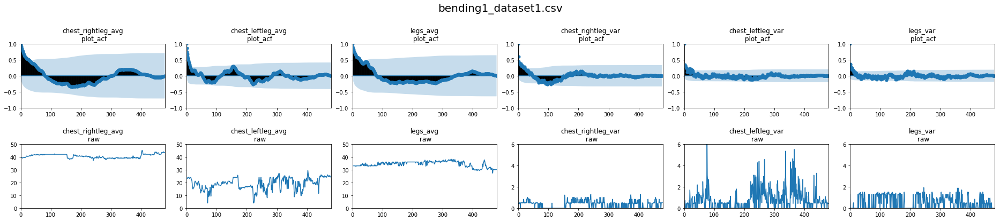

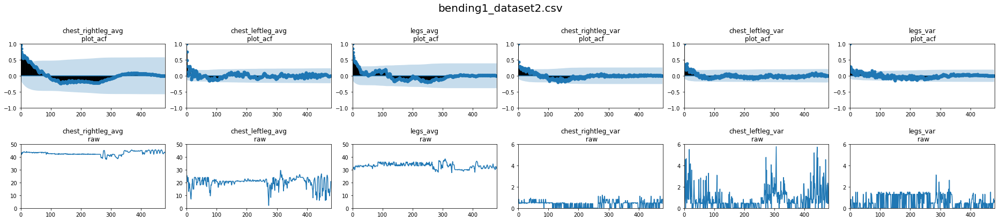

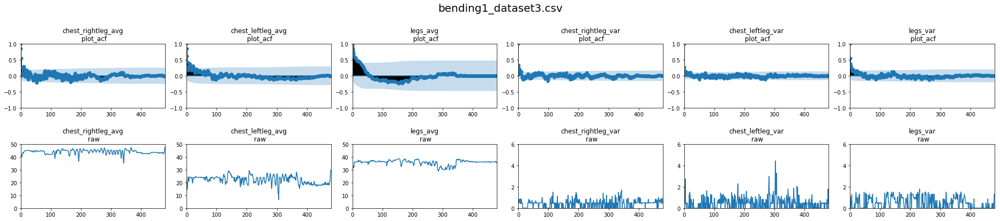

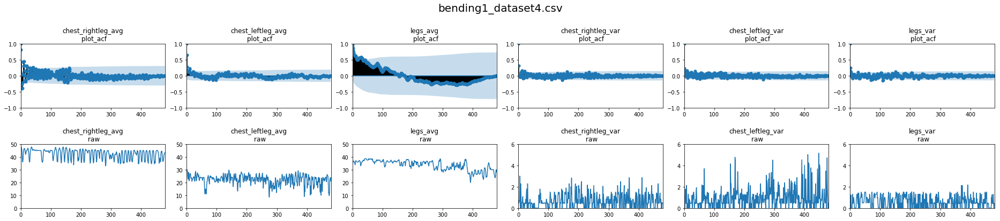

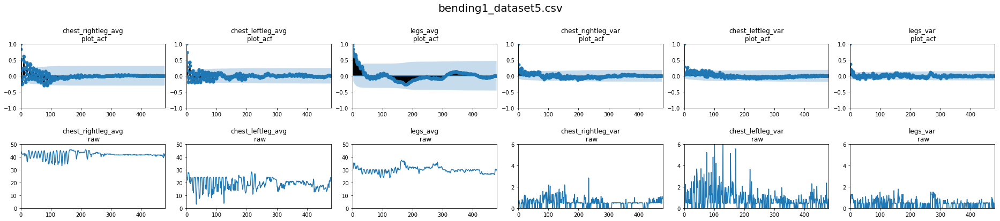

...

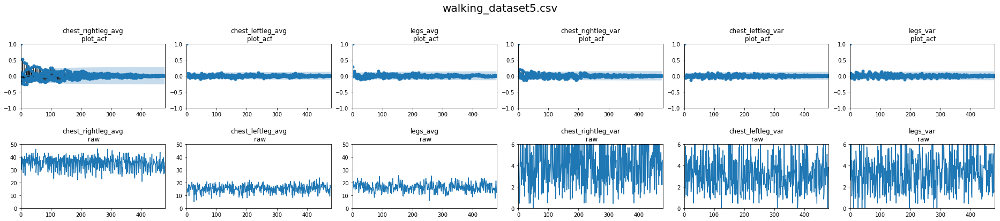

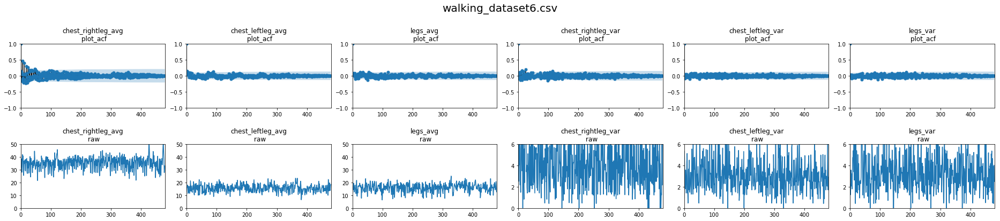

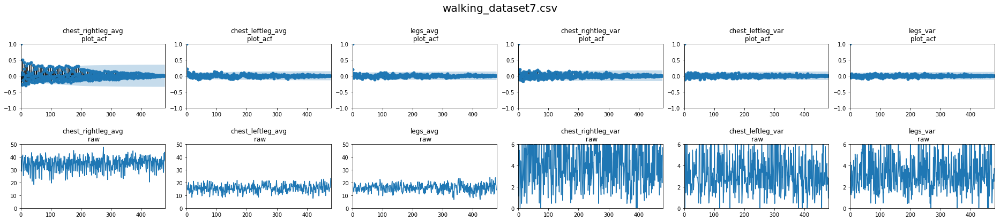

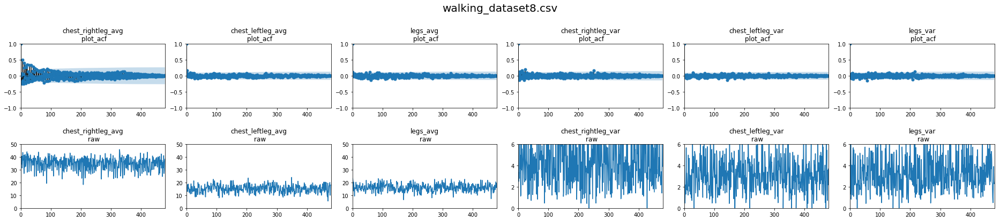

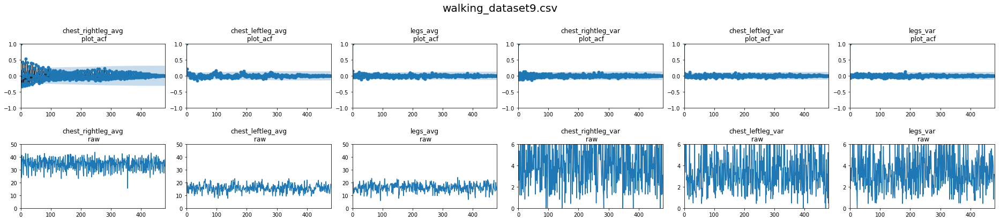

In [48]:
# Make a large set of plots to review
for i in range(0,len(tables_keys)):
    plotacfs(i)

In [14]:
# make an entire matrix of correlation coefficiencts
## This is some work I did before discovering the Fresh Algorithm which I use later. This work wasn't needed after finding the Fresh Algorithm.
data = make_frame_of_common_columns(list(ColumnRetrievalDictionary[list(ColumnRetrievalDictionary.keys())[0]].keys()),'Time',list(ColumnRetrievalDictionary.keys()),ColumnRetrievalDictionary)
data_corr = data.corr(method='pearson') 
# data_corr['row_names'] = data_corr.index # make the index into a column

In [15]:
# a function to retrieve a subset of a correlation matrix based on a list of values
## This is some work I did before discovering the Fresh Algorithm which I use later. This work wasn't needed after finding the Fresh Algorithm.
def getcorr_subset(strings_list, corrMatrix):
    # subset columns to list
    column_list = list(corrMatrix.columns.values)
    column_subset = [y for y in column_list for x in strings_list if x in y]
    # subset the rows based on the string list. Rows are done first because the temporary helper column will be lost during column subsetting
    corrMatrix['row_names'] = corrMatrix.index # make the index into a column to subset rows
    corrMatrix = corrMatrix[corrMatrix['row_names'].isin(column_subset)] # subset rows
    # now subset columns
    corrMatrix = corrMatrix[column_subset]
    return corrMatrix

In [16]:
# A helper function to select a ## This is some work I did before discovering the Fresh Algorithm which I use later. This work wasn't needed after finding the Fresh Algorithm.slice of a correlation matrix based on three substring lists. This is useful to create a subset of a subset.
## This is some work I did before discovering the Fresh Algorithm which I use later. This work wasn't needed after finding the Fresh Algorithm.
def three_substrings_corrsubset(stringone, stringtwo, stringthree, correlation_matrix): # Function takes three strins. Technically it could work with lists too.
    mat_1 = getcorr_subset(stringone, correlation_matrix) # note that the way this works is as an AND between lists but as an OR for aything within the same list.
    mat_2 = getcorr_subset(stringtwo, mat_1) # use 2nd string
    mat_3 = getcorr_subset(stringthree, mat_2) # use 3rd string
    return mat_3

In [17]:
# a helper function to create summary statistics of a correlation matrix
## This is some work I did before discovering the Fresh Algorithm which I use later. This work wasn't needed after finding the Fresh Algorithm.
def getstatsummary(correlationMatrix): # function only takes a single matrix as it's input
    mat_test1 = np.asarray(correlationMatrix) # convert the matrix to an numpy array
    datatosummary = list(mat_test1[np.triu_indices(mat_test1.shape[0], 1)]) # take the upper triagnular matrix minus the diagonal and make it a list.
    datasummary = sp.stats.describe(datatosummary) # get summary statistics for the matrix.
    return datasummary

In [19]:
# restacking similar activity types into flat dataframes to create a dictionary of data frames by activity type.
# Needed in order to recombine data for using the frsh algorithm.
stackedDict = {} # make an empty dictionary to fill with new dataframes
for i in range(0,len(Activity_types)): # index across previously defined activity types
    dataframes = [key for key in tables_keys if Activity_types[i] in key] # Select all data sets associated with a type of activity
    cols = list(All_tables[dataframes[i]].columns.values).remove('Activity') # create a column name list and drop the un-used Activty column
    newframe = pd.DataFrame(columns = cols) # create an empty dataframe to append to
    for j in range(0,len(dataframes)): # index across the sub list of dataframes in the dictionary
        frame_to_append = All_tables[dataframes[j]] # temporarily create a dataframe to append 
        frame_to_append['Test'] = dataframes[j] # add a test column
        newframe = newframe.append(frame_to_append) # append the dataframes iteratively  
    stackedDict[Activity_types[i]]= newframe # add the new dataframe to the dictionary

In [ ]:
%%time
# Create assorted features to use. This is a very powerful algorithm which extracts hundreds of features from time series data.
extracted_features_cols = list(extract_features(stackedDict[Activity_types[0]].drop(['Activity'], axis=1), column_id="Test", column_sort="Time", column_kind=None).columns.values) # get list of features. It's not very efficient to do this whole algorithm once just to get the column names...
FeaturesSet = pd.DataFrame(columns = extracted_features_cols) # create an empty dataframe out of the columns list
for i in range(0,len(Activity_types)): # iterate through the list of activity types
    frame_to_extractFeatures = stackedDict[Activity_types[i]].drop(['Activity'], axis =1)
    frame_to_append = extract_features(frame_to_extractFeatures, column_id="Test", column_sort="Time", column_kind=None) #calculate the new row of features
    frame_to_append = tsfresh.utilities.dataframe_functions.impute(frame_to_append) # fill all missing values This is done per activity in case the distributions are different
    FeaturesSet = FeaturesSet.append(frame_to_append) #append the values.

Feature Extraction: 100%|██████████| 9/9 [00:25<00:00,  2.82s/it]
 'chest_leftleg_var__friedrich_coefficients__m_3__r_30__coeff_1'
 'chest_leftleg_var__friedrich_coefficients__m_3__r_30__coeff_2'
 'chest_leftleg_var__friedrich_coefficients__m_3__r_30__coeff_3'
 'chest_leftleg_var__max_langevin_fixed_point__m_3__r_30'
 'chest_rightleg_avg__friedrich_coefficients__m_3__r_30__coeff_0'
 'chest_rightleg_avg__friedrich_coefficients__m_3__r_30__coeff_1'
 'chest_rightleg_avg__friedrich_coefficients__m_3__r_30__coeff_2'
 'chest_rightleg_avg__friedrich_coefficients__m_3__r_30__coeff_3'
 'chest_rightleg_avg__max_langevin_fixed_point__m_3__r_30'
 'chest_rightleg_var__friedrich_coefficients__m_3__r_30__coeff_0'
 'chest_rightleg_var__friedrich_coefficients__m_3__r_30__coeff_1'
 'chest_rightleg_var__friedrich_coefficients__m_3__r_30__coeff_2'
 'chest_rightleg_var__friedrich_coefficients__m_3__r_30__coeff_3'
 'chest_rightleg_var__max_langevin_fixed_point__m_3__r_30'
 'legs_var__friedrich_coefficients_

In [ ]:
#a helper function that encodes any dataframe column of type category or object. Needed to encode text strings.
def dummyEncode(df):
        columnsToEncode = list(df.select_dtypes(include=['category','object'])) # list columsn of the type to encode.
        le = LabelEncoder() # use the label encoder function imported at the top.
        for feature in columnsToEncode: #  loop through and encode columns.
            try:
                df[feature] = le.fit_transform(df[feature])
            except:
                print('Error encoding '+feature)
        return df

In [ ]:
# Create the target column
target = FeaturesSet
target['datasource'] = target.index.astype(str) # temporarily use index to extract the activity substring
target['Activity'] = target['datasource'].str.split('_', 1, expand=True)[0] #split the string
target_encoded = dummyEncode(target) # encode categorical data
target_encoded = target_encoded['Activity'] # select only the needed column
selected_features = select_features(FeaturesSet.drop(['Activity', 'datasource'], axis=1), target_encoded) # boil down to only the significant features

In [ ]:
# create train and test splits
X_train, X_test, y_train, y_test = train_test_split(selected_features, target['Activity'], test_size = 0.5, random_state = 0)

In [ ]:
# a function to build an ensemble.
def train_test_model(xtrain, ytrain, xtest, ytest, parameters): #parameters needs to be a dictionary
    random.seed(12345)
    clf1 = ExtraTreesClassifier(bootstrap=True)
    clf2 = RandomForestClassifier(bootstrap=True)
    clf3 = GradientBoostingClassifier()
    clf4 = XGBClassifier()
    #clf5 = SVC(kernel='poly', probability=True) ##(commented out because it reduced accuracy)
    #clf6 = MLPClassifier() ##(commented out because it reduced accuracy)
    #clf7 = AdaBoostClassifier() ##(commented out because it reduced accuracy)
    eclf = VotingClassifier(estimators=[('etc', clf1), ('rf', clf2), ('gbc', clf3), 
                                        ('xgb', clf4)], voting='soft') #('svc', clf5), ('mlp', clf6), ('ada', clf7)], voting='soft')
    params = parameters

    grid1 = GridSearchCV(estimator=eclf, param_grid=params, cv=5)
    #grid1 = RandomizedSearchCV(estimator=eclf, param_distributions=params, n_iter=100, cv=5) ## (commented out because in the final steps I was tweaking in the neighborhoods of optimal parameters)
    grid1 = grid1.fit(xtrain, ytrain)

    print ("Grid best score: ", grid1.best_score_)
    print ("Grid test score: ", grid1.score(xtest,ytest))
    print ("Grid best params:", grid1.best_params_)
    return grid1

In [ ]:
%%time 
# for printing the total time to run
params = {'rf__n_estimators': [51], 
          'xgb__n_estimators': [1], 
          'etc__n_estimators': [81],
          'gbc__n_estimators': [91],
          'etc__max_depth': [4],
          'rf__max_depth': [4], 
          'gbc__max_depth': [4],
          'xgb__max_depth': np.arange(1,10,1)
         }
with warnings.catch_warnings(): # there is a pesky deprication warning that can be ignored.
    warnings.simplefilter("ignore")
    Modelset = train_test_model(X_train, y_train, X_test, y_test, params) #run model function accordingly

In [49]:
# Best average between test and train values below:

#Grid best score:  0.9545454545454546
#Grid score function:  0.9318181818181818
#Grid best params: {'xgb__n_estimators': 1, 'rf__n_estimators': 51, 'rf__max_depth': 4, 'gbc__n_estimators': 91, 'gbc__max_depth': 4, 'etc__n_estimators': 81, 'etc__max_depth': 4}
#Wall time: 16min 1s

In [ ]:
# Best test score below

# Grid best score:  0.8636363636363636
# Grid test score:  0.9545454545454546
# Grid best params: {'xgb__n_estimators': 81, 'xgb__max_depth': 2, 'rf__n_estimators': 61, 'rf__max_depth': 7, 'gbc__n_estimators': 1, 'gbc__max_depth': 9, 'etc__n_estimators': 21, 'etc__max_depth': 6}
# Wall time: 15min 3s